In [1]:
using Pkg
Pkg.activate(".")
import PowerModels as PM
import MathOptInterface as MOI
import JSON 
import Glob
using LinearAlgebra: cond
using Plots
const SOLVED_STATUSES = [MOI.OPTIMAL, MOI.LOCALLY_SOLVED, MOI.ALMOST_OPTIMAL, MOI.ALMOST_LOCALLY_SOLVED]
include("utils.jl")
PM.silence()

  Activating project at `~/Documents/Projects/pfdelta/plots_and_final_checks`


[info | PowerModels]: Suppressing information and warning messages for the rest of this session.  Use the Memento package for more fine-grained control of logging.


In [2]:
pq_buses = [bus["index"] for (i, bus) in case["bus"] if bus["bus_type"] == 1]

# Filter load entries where load is at a PQ bus
pq_load_indices = []

for (i, load) in case["load"]
    if load["load_bus"] in pq_buses
        push!(pq_load_indices, parse(Int, i))  # PowerModels load IDs are strings
    end
end

# Get first 7 load indices connected to PQ buses
selected_loads = pq_load_indices[1:7]

println("7 load indices on PQ buses: ", selected_loads)

UndefVarError: UndefVarError: `case` not defined

In [3]:
with open("file1.json") as f1, open("file2.json") as f2:
    data1 = json.load(f1)
    data2 = json.load(f2)

if data1 == data2:
    print("The files are the same.")
else:
    print("The files are different.")

ErrorException: syntax: extra token "open" after end of expression

In [4]:
root = "../data/pfdelta/case118/none/close2inf_train"
solved_cases_path = joinpath(root, "around_nose") 
sample_nums = [12, 73, 302, 599]

# Initialize arrays
files = Dict(sample => Glob.glob("sample_$(sample)_*.json", solved_cases_path) for sample in sample_nums)

# Results 
results = Dict{Int64, Dict{Float64, Tuple{Float64, Bool, Float64}}}()

Dict{Int64, Dict{Float64, Tuple{Float64, Bool, Float64}}}()

In [5]:
# Power flow jacobian
for sample in sample_nums
    results[sample] = Dict{Float64, Tuple{Float64, Bool, Float64}}()  # initialize inner dict
    for file in files[sample]
        json_dict = JSON.parsefile(file) # it's not going to be the whole json file
        lam = json_dict["lambda"]
        net = json_dict["solved_net"]

        # Build Jacobian and get condition number
        net = PM.make_basic_network(net)
        J = PM.calc_basic_jacobian_matrix(net)

        # Try to solve NR from a flat start
        pf_solution = PM.compute_ac_pf(net; flat_start=true)
        converged =  pf_solution["termination_status"] in SOLVED_STATUSES
        solve_time = pf_solution["solve_time"]
        
        # Save results
        results[sample][lam] = (cond(Array(J), 2), converged, solve_time)
    end
end

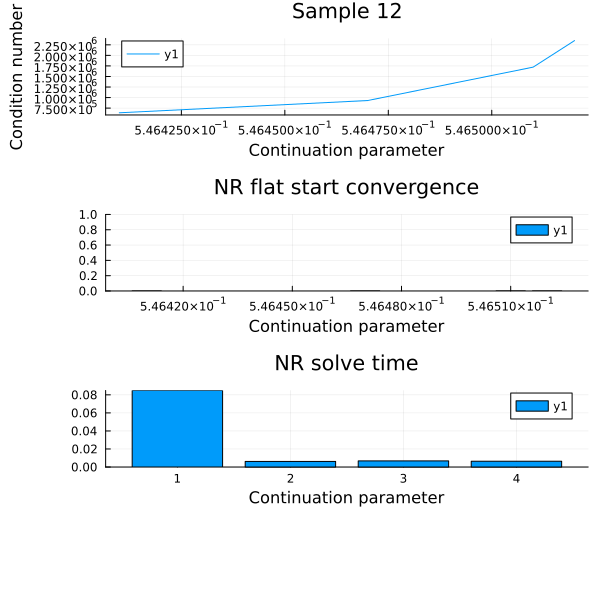

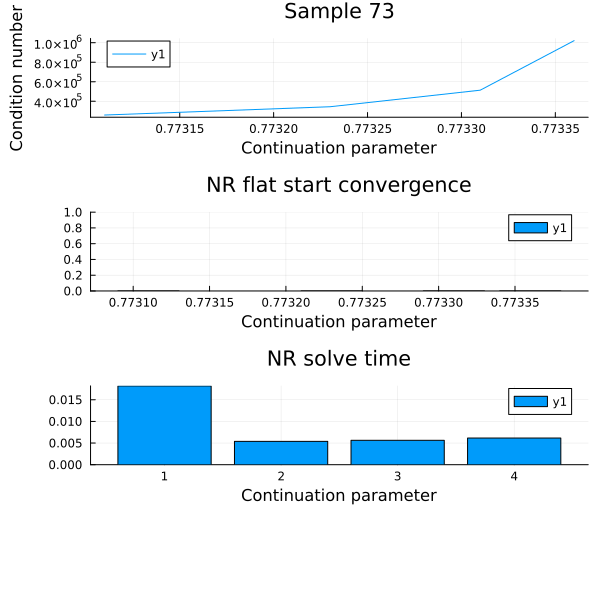

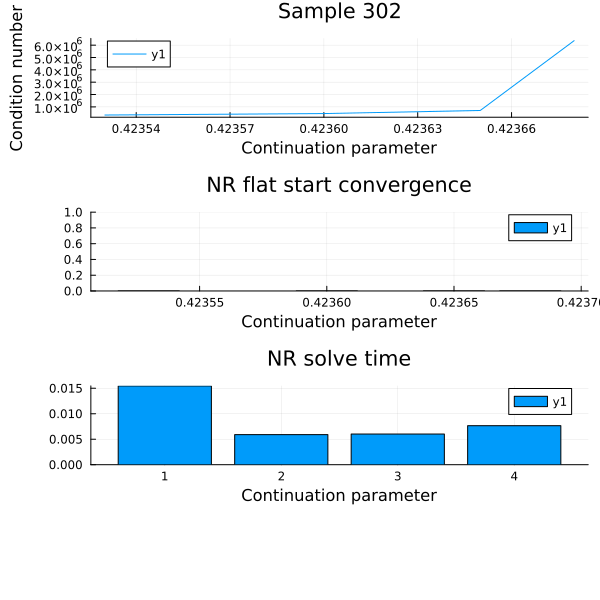

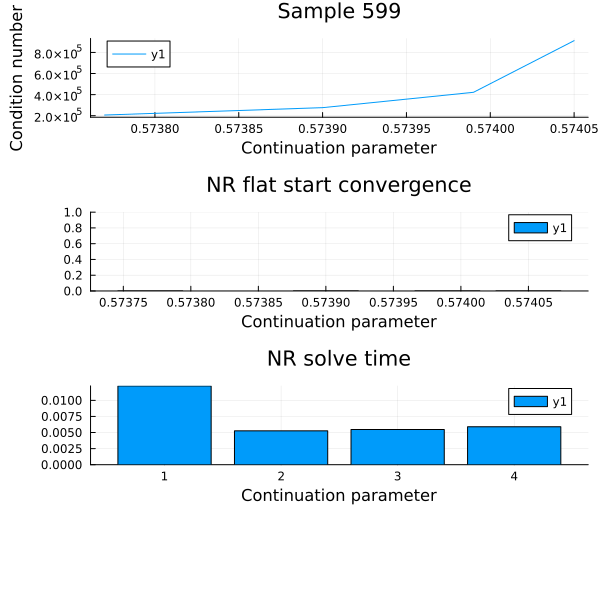

In [6]:
# Plots for the around the nose points
for sample in sample_nums
    sample_results = results[sample]
    lams = sort(collect(keys(sample_results)))
    vals = [sample_results[lam] for lam in lams]

    cond_nums = first.(vals)
    convergence = getindex.(vals, 2)
    solve_time = last.(vals)

    p1 = plot(lams, cond_nums, title = "Sample $sample", ylabel="Condition number", xlabel="Continuation parameter")
    p2 = bar(lams, convergence, title="NR flat start convergence", xlabel="Continuation parameter")
    p4 = bar(1:length(solve_time), solve_time, title="NR solve time", xlabel="Continuation parameter")
    fig = plot(p1, p2, p4, layout = (4, 1), size = (600, 600))
    display(fig)
end

In [7]:
# Plots for all point created with continuation power flow  
results = Dict{Int64, Dict{Float64, Tuple{Float64, Bool, Float64}}}()
pv_curve_data = Dict{Int64, Dict{Float64, Dict}}()
raw_path = joinpath(root, "raw")
for sample in sample_nums
    results[sample] = Dict{Float64, Tuple{Float64, Bool, Int64, Float64}}()
    pv_curve_data[sample] = Dict{Float64, Dict}()
    get_condition_num_and_NR(results, raw_path, sample, pv_curve_data)
end

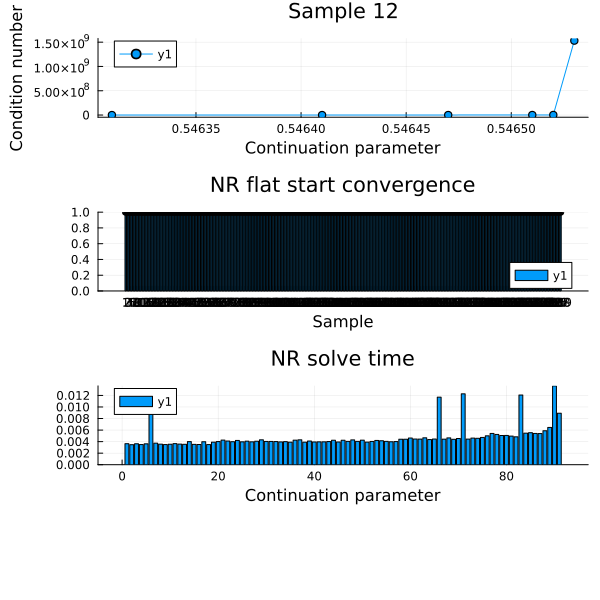

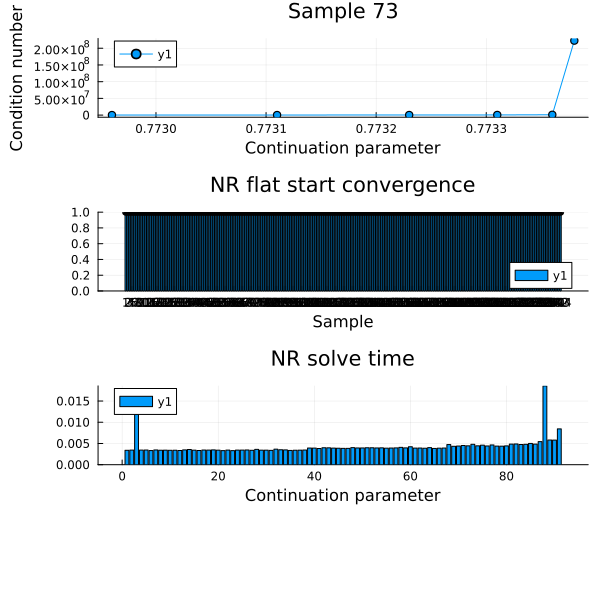

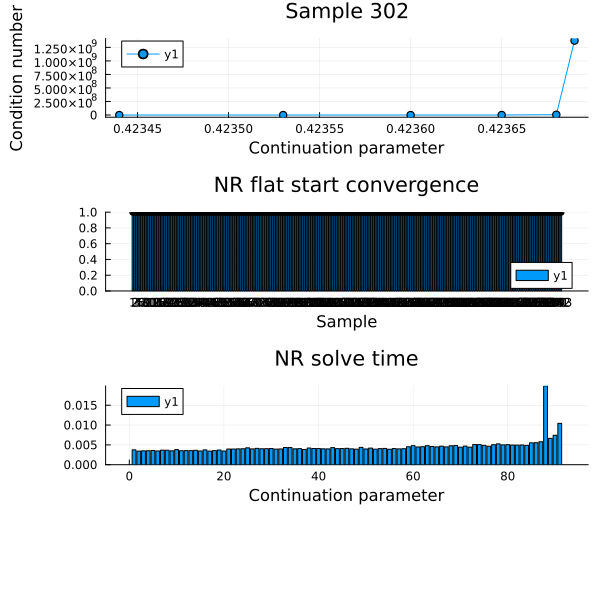

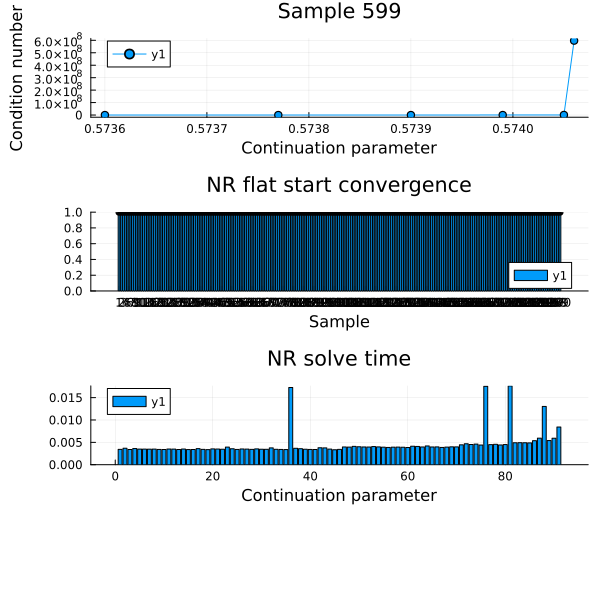

In [8]:
for sample in sample_nums
    sample_results = results[sample]
    lams = sort(collect(keys(sample_results)))
    vals = [sample_results[lam] for lam in lams]

    cond_nums = first.(vals)
    convergence = getindex.(vals, 2)
    solve_time = last.(vals)

    p1 = plot(lams[end-5:end], cond_nums[end-5:end], title = "Sample $sample", ylabel="Condition number", xlabel="Continuation parameter", marker = :circle)
    p2 = bar(1:length(convergence), convergence, title="NR flat start convergence", xlabel="Sample", xticks=1:length(convergence))
    scatter!(1:length(convergence), convergence, markershape=:circle, color=:black, label="")  
    p4 = bar(1:length(solve_time[end-90:end]), solve_time[end-90:end], title="NR solve time", xlabel="Continuation parameter")

    fig = plot(p1, p2, p4, layout = (4, 1), size = (600, 600))
    display(fig)
end

# Only condition numbers

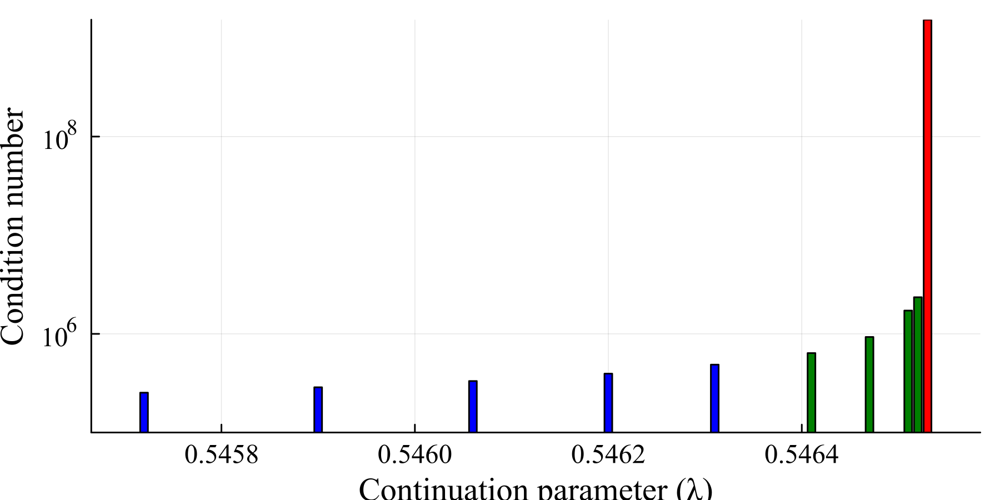

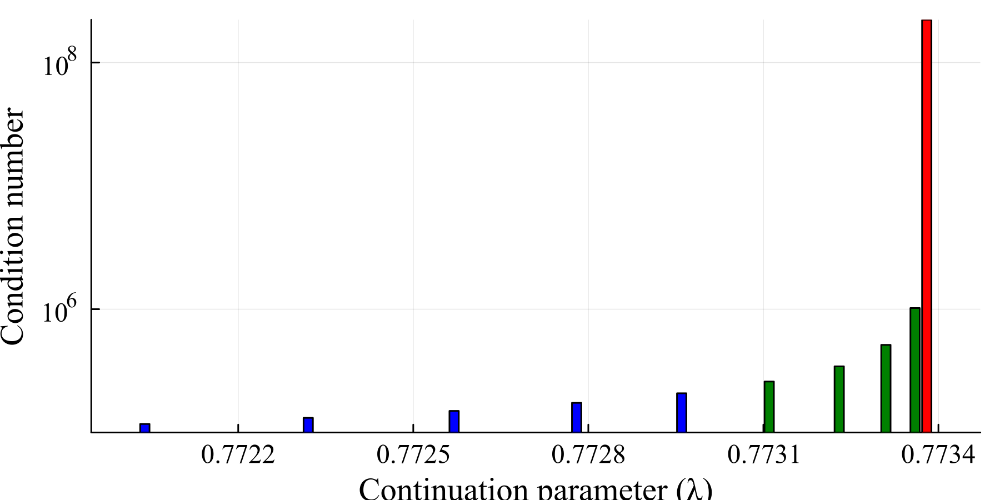

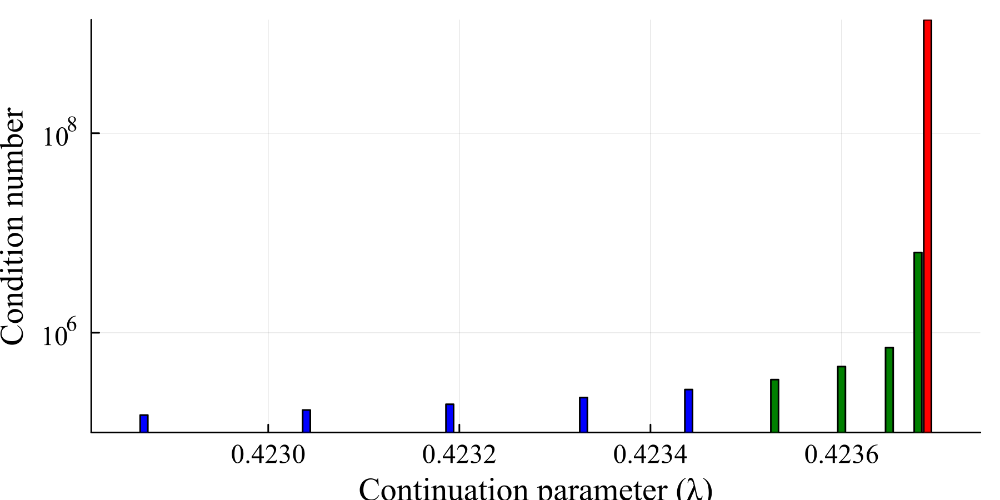

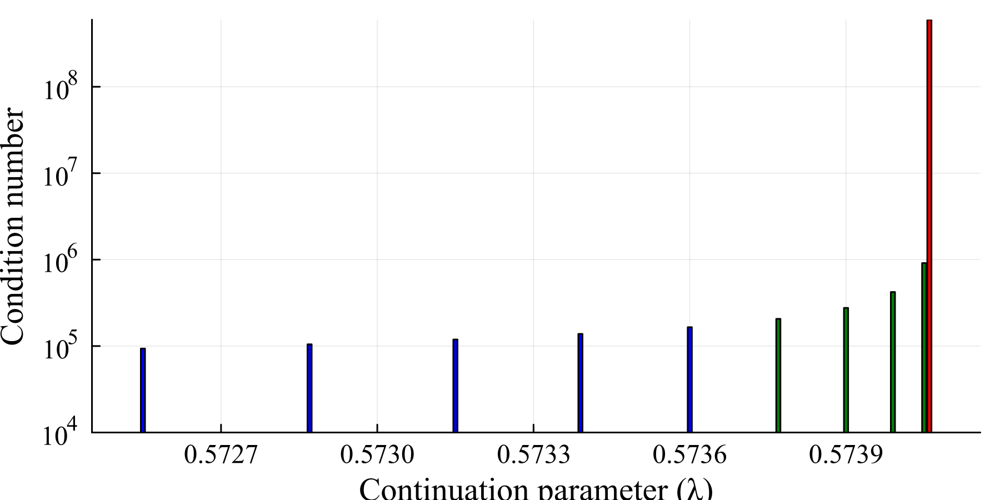

In [9]:
# Set global plot styles
output_dir_cond = "condition_number_plots"

default(
    fontfamily = "Times New Roman",
    guidefontsize = 12,
    titlefontsize = 16,
    tickfontsize = 10,
    legendfontsize = 12
)

for sample in sample_nums
    sample_results = results[sample]
    lams = sort(collect(keys(sample_results)))
    vals = [sample_results[lam] for lam in lams]

    cond_nums = first.(vals)
    convergence = getindex.(vals, 2)
    solve_time = last.(vals)

    # Extract last 6 values
    bar_lams = lams[end-9:end]
    bar_conds = cond_nums[end-9:end]

    # Color scheme: all blue, then update the last 5
    n = length(bar_lams)
    bar_colors = fill(:blue, n)
    if n >= 5
        bar_colors[end-4:end-1] .= :green
    end
    bar_colors[end] = :red

    # Bar plot
    p1 = bar(bar_lams, bar_conds,
            xlabel = "Continuation parameter (λ)",
            ylabel = "Condition number",
            legend = false,
            fillcolor = bar_colors,
            yscale = :log10,
            dpi = 300,
            grid = :auto
            )


    fig = plot(p1, size = (600, 300))
    display(fig)
    gui()
    savefig(fig, joinpath(output_dir_cond, "cond_num_sample$(sample).png"))


end

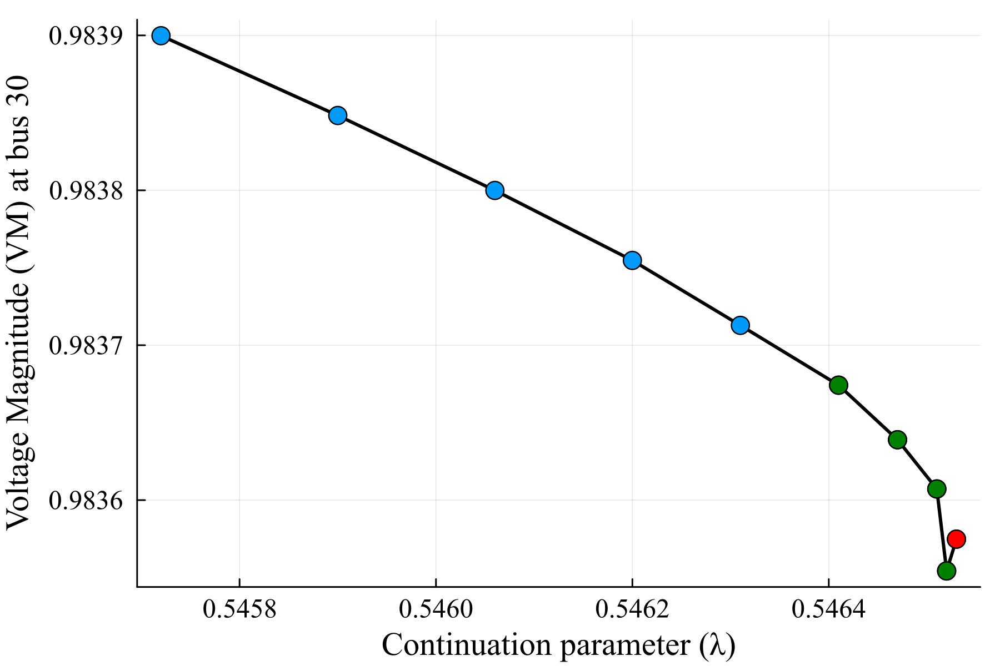

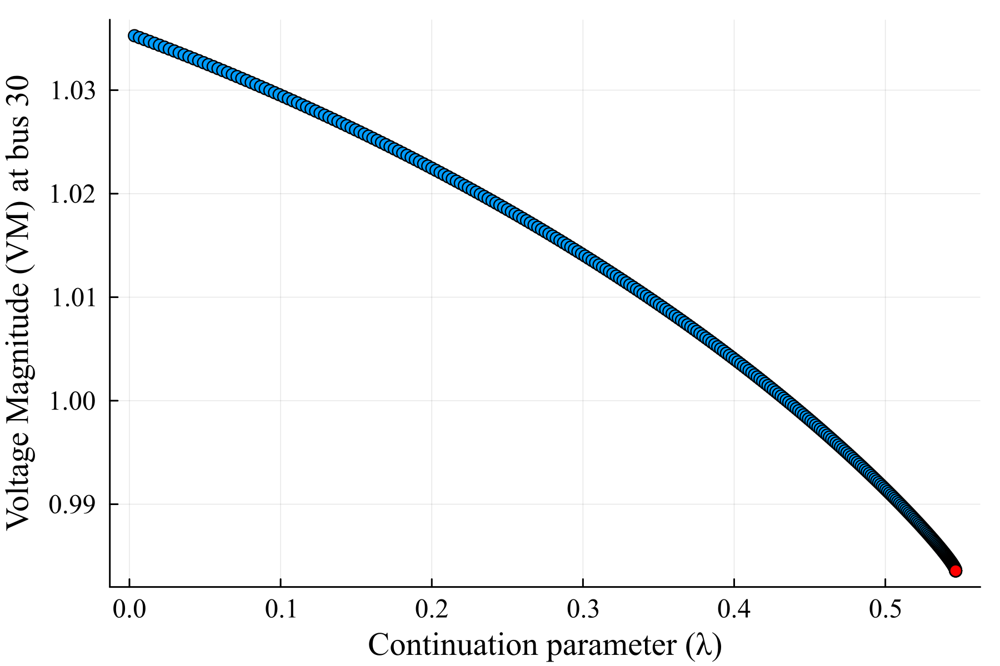

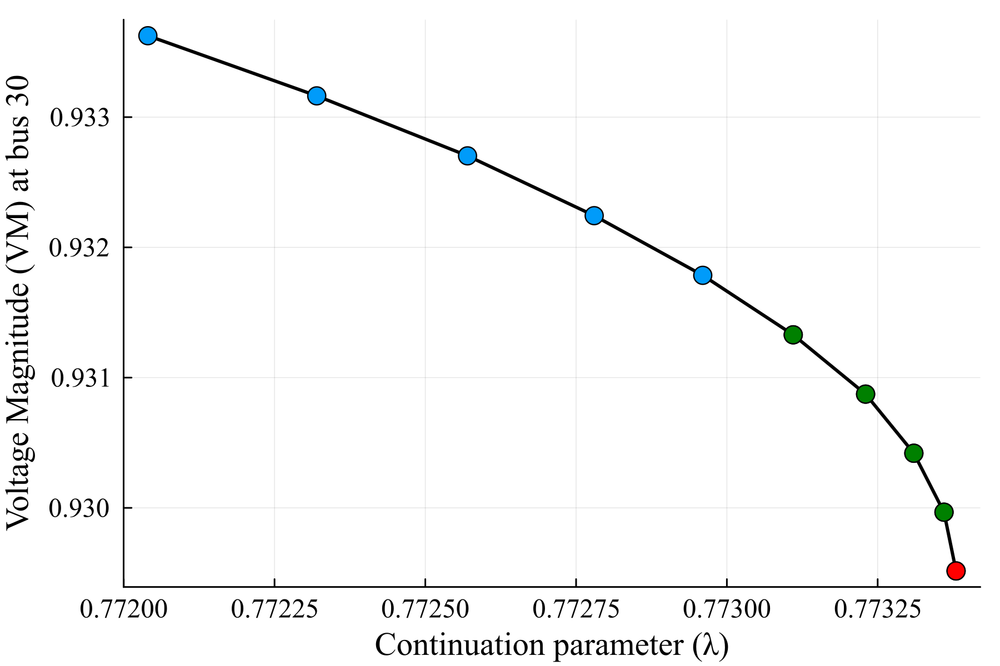

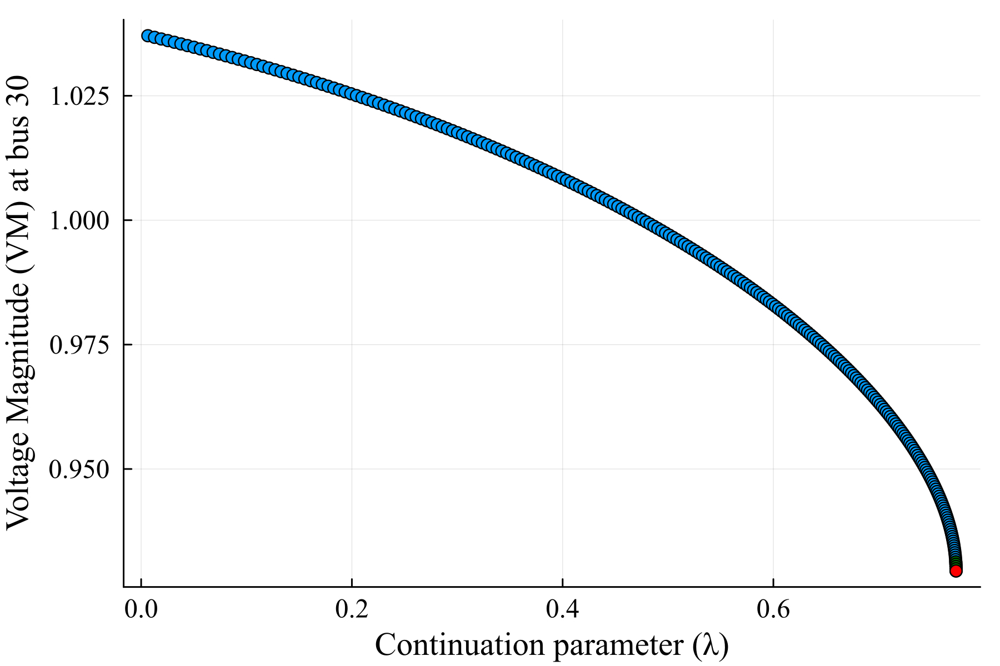

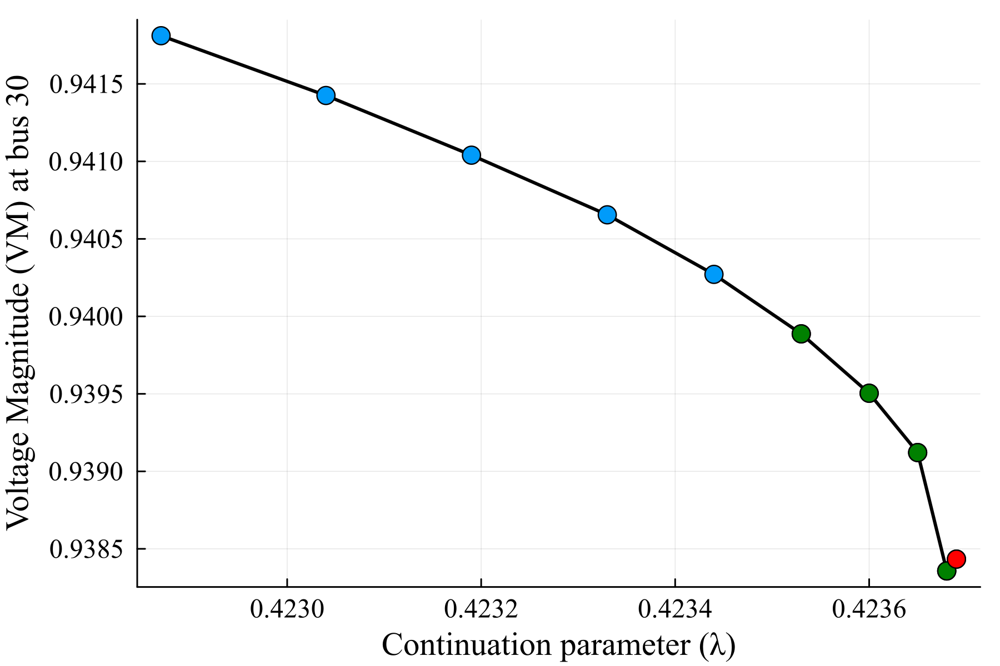

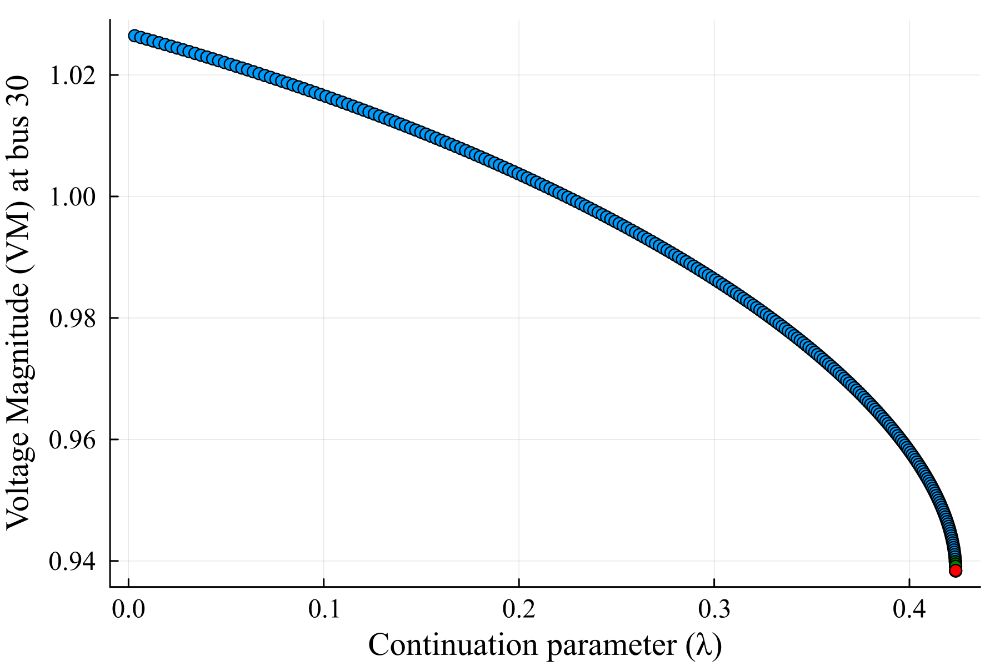

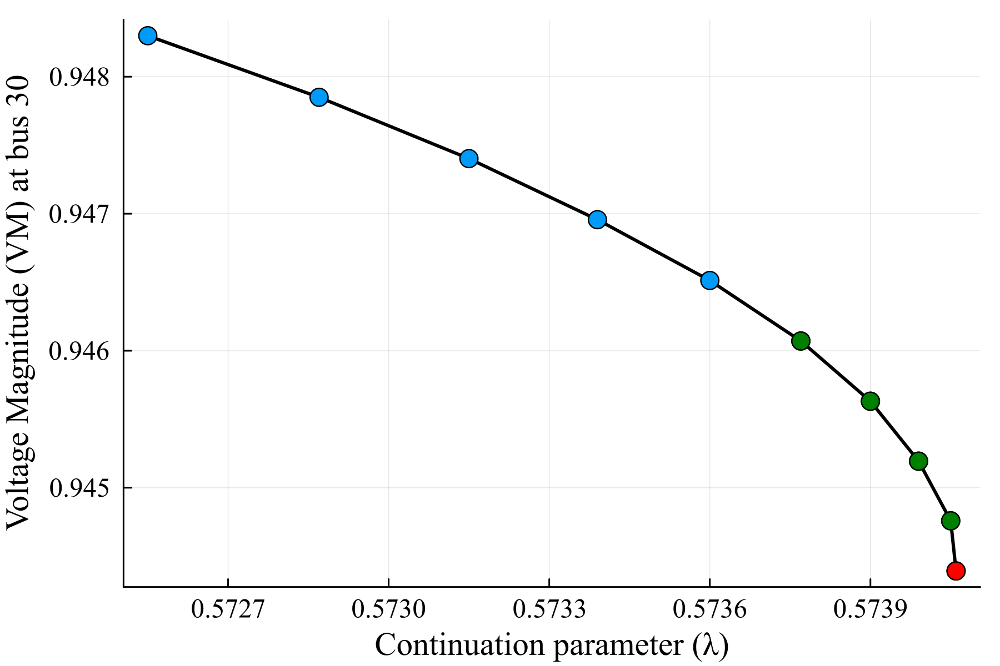

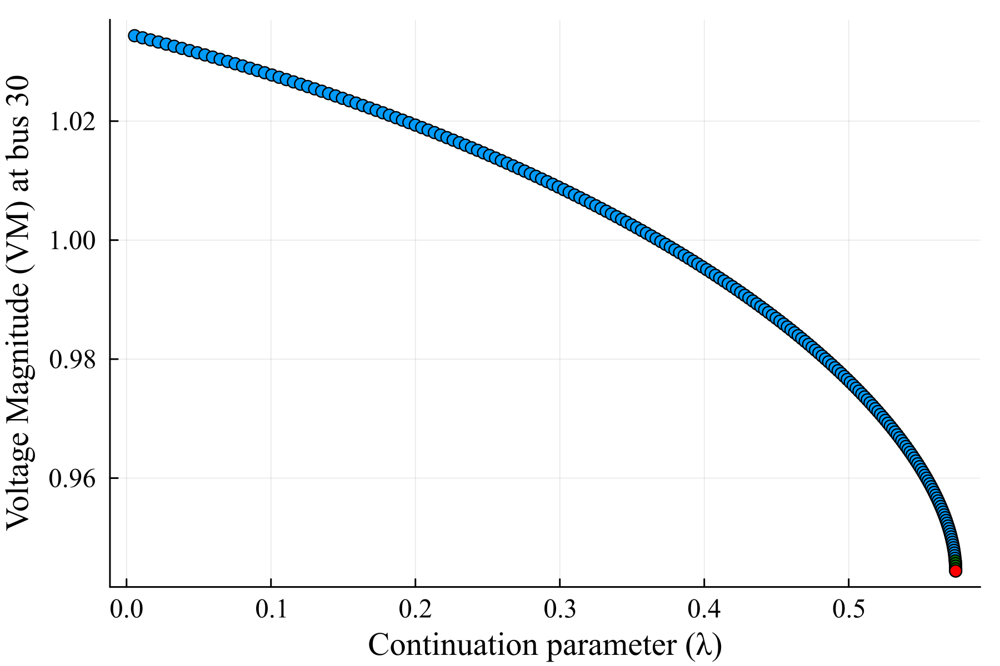

In [11]:
selected_bus = 30  # must be a PQ bus

# Set global plot styles
default(
    fontfamily = "Times New Roman",
    guidefontsize = 12,
    titlefontsize = 16,
    tickfontsize = 10,
    legendfontsize = 12
)
output_dir = "pv_curve_plots"

for sample in sample_nums
    lam_vm_pairs = Vector{Tuple{Float64, Float64}}()
    
    for (lam, net) in pv_curve_data[sample]
        vm = net["bus"][string(selected_bus)]["vm"]
        push!(lam_vm_pairs, (lam, vm))
    end

    # Sort by lambda
    sorted_pairs = sort(lam_vm_pairs, by = x -> x[1])
    lams = [x[1] for x in sorted_pairs]
    vms = [x[2] for x in sorted_pairs]

    n = length(lams)
    idx_last = n
    idx_green = max(n - 4, 1):(n - 1)
    idx_rest = 1:max(n - 5, 0)

    #### Plot p1: Only last 5 points with lines between them
    p1 = plot(lams[end-10+1:end], vms[end-10+1:end],
              label = "",
              xlabel = "Continuation parameter (λ)",
              ylabel = "Voltage Magnitude (VM) at bus $selected_bus",
              linecolor = :black,
              marker = :circle,
              legend = false,
                markersize = 6,
            linewidth = 2,
              dpi = 300)

    # Color the last 4 in green
    scatter!(lams[idx_green], vms[idx_green],
             markercolor = :green,
             marker = :circle,
            markersize = 6,
             label = "")

    # Color the last point in red
    scatter!([lams[idx_last]], [vms[idx_last]],
             markercolor = :red,
             marker = :circle,
            markersize = 6,
             label = "")

    #### Plot p2: Full PV curve with highlighted last points
    p2 = plot(lams, vms,
              label = "",
              xlabel = "Continuation parameter (λ)",
              ylabel = "Voltage Magnitude (VM) at bus $selected_bus",
              linecolor = :black,
              marker = :circle,
              legend = false,
              dpi = 300)

    scatter!(lams[idx_green], vms[idx_green],
             markercolor = :green,
             marker = :circle,
             label = "")

    scatter!([lams[idx_last]], [vms[idx_last]],
             markercolor = :red,
             marker = :circle,

             label = "")

    display(p1)
    gui()
    display(p2)
    gui()
    savefig(p1, joinpath(output_dir, "pv_zoom_sample$(sample).png"))
    savefig(p2, joinpath(output_dir, "pv_full_sample$(sample).png"))
end
